In [256]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

In [264]:
def findCorrespondence(img1, img2, method):
    img1_gray = cv.cvtColor(img1, cv.COLOR_BGR2GRAY)
    img2_gray = cv.cvtColor(img2, cv.COLOR_BGR2GRAY)

    if method == 0:
        # Initiate SIFT detector
        met_type = cv.SIFT_create()
        bf = cv.BFMatcher(cv.NORM_L2) 
    elif method == 1:
        # Initiate ORB detector
        met_type = cv.ORB_create(1000)
        bf = cv.BFMatcher(cv.NORM_HAMMING)
    else:
        raise ValueError('Method must be 0 (SIFT) or 1 (ORB)')

    # find the keypoints and descriptors
    kp1, des1 = met_type.detectAndCompute(img1_gray, None)
    kp2, des2 = met_type.detectAndCompute(img2_gray, None)



    # Match descriptors.
    matches = bf.knnMatch(des1, des2, k=2)

    # Apply ratio test
    good_ratio = []
    for m, n in matches:
        if m.distance < 0.7*n.distance:
            good_ratio.append([m])


    # Extract location of good matches
    matches = good_ratio
    src_points = np.zeros((len(matches), 2), dtype=np.float32)
    dst_points = np.zeros((len(matches), 2), dtype=np.float32)

    for i, match in enumerate(matches):
        src_points[i, :] = kp1[match[0].queryIdx].pt
        dst_points[i, :] = kp2[match[0].trainIdx].pt

    """
    print(len(src_points), 'good matches found')
    img_match_ratio = cv.drawMatchesKnn(img1, kp1, img2, kp2, good_ratio, None, flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    plt.figure(figsize=(20, 20), dpi=80)
    plt.imshow(img_match_ratio)
    plt.show()
    """
    return src_points, dst_points

In [258]:
def estimateTransform(img1, img2, model, method):

    src_points, dst_points = findCorrespondence(img1, img2, method)

    #print(len(src_points), 'good matches found')
    
    match model:
        case 0:
            if len(src_points) < 4:
                raise ValueError('Not enough good matches found - at least 4 required')
            H, _ = cv.findHomography(src_points, dst_points, cv.RANSAC, ransacReprojThreshold=5.0)
        case 1: 
            if len(src_points) < 3:
                raise ValueError('Not enough good matches found - at least 3 required')
            H, _ = cv.estimateAffine2D(src_points, dst_points, method=cv.RANSAC, ransacReprojThreshold=5.0)
            H = np.vstack([H, [0,0,1]])

        case 2:
            if len(src_points) < 2:
                raise ValueError('Not enough good matches found - at least 2 required')
            H, _ = cv.estimateAffinePartial2D(src_points, dst_points, method=cv.RANSAC, ransacReprojThreshold=5.0)
            H = np.vstack([H, [0,0,1]])
        case _:
            raise ValueError('Model must be homography, affine or similarity')
        
    
    

        
    return H


In [259]:
def stichImages(img, H):

    num_of_images = len(img)

    outline_in = []
    outline_in_h = []

    for i in range(0, num_of_images):
        h, w = img[i].shape[:2]
        outline_in.append(np.array([[0, 0], [w-1, 0], [w-1, h-1], [0, h-1]], dtype=np.float32))
        outline_in_h.append(np.array([[0, 0, 1], [w-1, 0, 1], [w-1, h-1, 1], [0, h-1, 1]], dtype=np.float32))

    outline_out = np.zeros_like(outline_in)
    outline_out_h = np.zeros_like(outline_in_h)

    for i in range(0, num_of_images):
        outline_out_h[i] = np.transpose(H[i] @ np.transpose(outline_in_h[i]))
        outline_out[i] = np.divide(outline_out_h[i][:,:2], outline_out_h[i][:,[-1]])

    out_x_min, out_y_min = (outline_out.min(axis=0)).min(axis=0)
    out_x_max, out_y_max = (outline_out.max(axis=0)).max(axis=0)

    print(out_x_min, out_y_min, out_x_max, out_y_max)

    width_out = np.int32(out_x_max - out_x_min)
    height_out = np.int32(out_y_max - out_y_min)

    print(width_out, height_out)

    T = np.array([[1, 0, -out_x_min],
                [0, 1, -out_y_min],
                [0, 0,          1]], dtype=np.float32)

    for i in range(0, num_of_images):
        outline_out[i][:] = outline_out[i][:] - [out_x_min, out_y_min]

    #outline_out_img = np.zeros((height_out, width_out, 3))
    output_img = np.zeros((height_out, width_out, 3))

    for i in range(0, num_of_images):
        #outline_out_img = cv.polylines(outline_out_img,[np.int32(outline_out[i])], True, 255, 3)
        mask = np.ones_like(img[i])
        mask = cv.warpPerspective(mask, T@H[i], (width_out, height_out))
        temp = cv.warpPerspective(img[i], T@H[i], (width_out, height_out))
        output_img[mask>0] = temp[mask>0]

    return output_img  

In [296]:
def H_recursive(H, dst_img_idx, ind, i):
    if ind[i] == 1:
        #print(str(i) + '@', end='')
        #print(np.shape(H[i]))
        return H[i]
    else:
        ind[i] = 1
        H[i] = H_recursive(H, dst_img_idx, ind, dst_img_idx[i]) @ H[i]
        return H[i]

In [309]:
def createPanorama(img, dst_img_idx, model, method):

    dst_img_idx_final = dst_img_idx
    num_of_images = len(img)
    num_of_matches = np.zeros(num_of_images, dtype=np.int32)

    if dst_img_idx == -1:
        # finding the best reference image for each image
        dst_img_idx_final = np.zeros(num_of_images, dtype=np.int32)
        for i in range(0, num_of_images):
            #num_of_matches = 0
            print('Finding best reference image for image ' + str(i))
            for j in range(0, num_of_images):
                if i == j or i == dst_img_idx_final[j] and i != 0:
                    continue
                tmp = len(findCorrespondence(img[i], img[j], method)[0])
                if tmp > num_of_matches[i]:
                    num_of_matches[i] = tmp
                    dst_img_idx_final[i] = j
            print('Best reference image for image ' + str(i) + ' is image ' + str(dst_img_idx_final[i]) + ' with ' + str(num_of_matches[i]) + ' matches')

        # choosing the best reference image
        ref_image = np.zeros(num_of_images, dtype=np.int32)
        for i in range(0, num_of_images):
            ref_image[dst_img_idx_final[i]] += 1
        best_ref_image = 0
        for i in range(0, num_of_images):
            if ref_image[i] > ref_image[best_ref_image]:
                best_ref_image = i
        dst_img_idx_final[best_ref_image] = best_ref_image
        print('Best reference image is image ' + str(best_ref_image) + ' with ' + str(ref_image[best_ref_image]) + ' matches')

    print(dst_img_idx_final)
    
    H = []
    Ind = np.zeros(len(img), dtype=np.int32)
    
    for i in range(0, num_of_images):
        if i == dst_img_idx_final[i]:
            Ind[i] = 1
            H.append(np.eye(3))
        else:
            H.append(estimateTransform(img[i], img[dst_img_idx_final[i]], model, method))
            #print(H[i])


    #calculate homographies to the destination image recursively
    
    for i in range(0, num_of_images):
        H[i] = H_recursive(H, dst_img_idx_final, Ind, i)
    
    
    return H
    

In [320]:
img = []
dst_img_idx1 = [1, 1, 0, 4, 1]
#dst_img_idx2 = [1, 2, 2, 0]

for i in range(0, 5):
	img.append(cv.imread('imgs/pano_custom/custom' + str(i + 1) + '.jpeg'))
	img[i] = cv.cvtColor(img[i], cv.COLOR_BGR2RGB)
	
H1 = createPanorama(img, -1, 0, 1)
#H2 = createPanorama(img, dst_img_idx2, 0, 0)

#output_img = stichImages(img, H)




Finding best reference image for image 0
Best reference image for image 0 is image 1 with 105 matches
Finding best reference image for image 1
Best reference image for image 1 is image 2 with 134 matches
Finding best reference image for image 2
Best reference image for image 2 is image 3 with 34 matches
Finding best reference image for image 3
Best reference image for image 3 is image 4 with 63 matches
Finding best reference image for image 4
Best reference image for image 4 is image 1 with 25 matches
Best reference image is image 1 with 2 matches
[1 1 3 4 1]


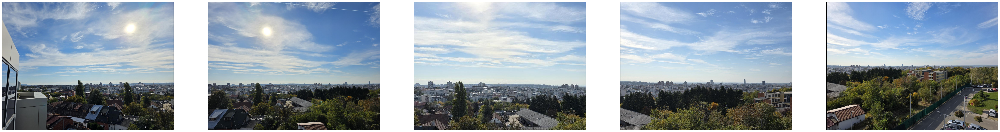

-4047.3823 -1617.5162 7478.3794 4066.1536
11525 5683


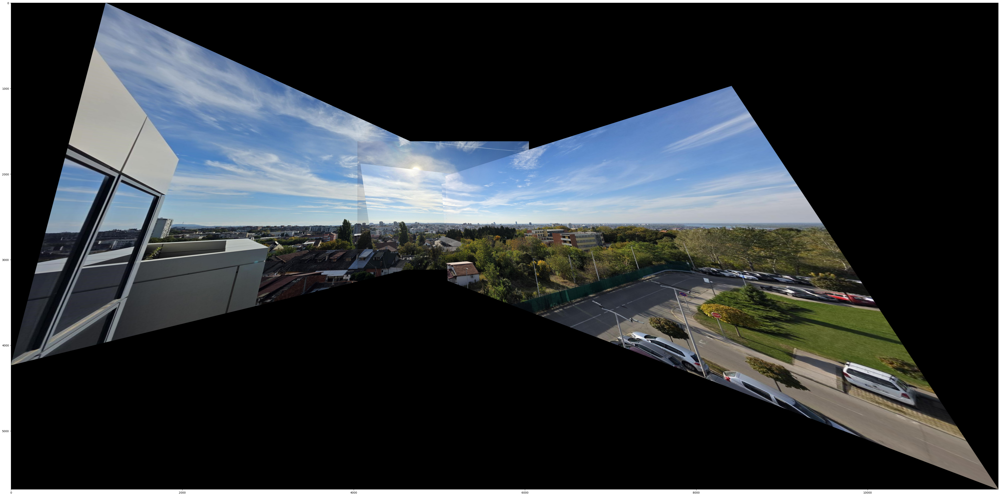

"\nfig, axs = plt.subplots(figsize=(64,64))\nplt.imshow(output_img2.astype('uint8'))\nplt.show()\n"

In [321]:
fig, axs = plt.subplots(1, 5, figsize=(64,64))
for i in range(0,5):
	axs[i].imshow(img[i])
	axs[i].get_xaxis().set_visible(False)
	axs[i].get_yaxis().set_visible(False)
plt.show()

output_img1 = stichImages(img, H1)
#output_img2 = stichImages(img, H2)

fig, axs = plt.subplots(figsize=(64,64))
plt.imshow(output_img1.astype('uint8'))
plt.show()
"""
fig, axs = plt.subplots(figsize=(64,64))
plt.imshow(output_img2.astype('uint8'))
plt.show()
"""

[[0. 0.]
 [4. 0.]
 [4. 3.]
 [0. 3.]]
[[0. 4. 4. 0.]
 [0. 0. 3. 3.]
 [1. 1. 1. 1.]]
